# Hands-on Image Processing with Python
## Chapter 1: Getting started with Image Processing

### Author: Sandipan Dey

### Import libraries

In [1]:
%matplotlib inline
import skimage
print(skimage.__version__)
import numpy as np
from PIL import Image, ImageFont, ImageDraw
from PIL.ImageChops import add, subtract, multiply, difference, screen
import PIL.ImageStat as stat
from skimage.io import imread, imsave, imshow, show, imread_collection, imshow_collection
from skimage import color, viewer, exposure, img_as_float, data
from skimage.transform import SimilarityTransform, warp, swirl
from skimage.util import invert, random_noise, montage
import matplotlib.image as mpimg
import matplotlib.pylab as plt
from matplotlib.colors import LinearSegmentedColormap
from scipy.ndimage import affine_transform, zoom
from scipy import misc

0.18.1


<ipython-input-1-52672d50db7d>:9: UserWarning: Viewer requires Qt
  from skimage import color, viewer, exposure, img_as_float, data


### Reading, saving, and displaying an image using PIL

In [5]:
im = Image.open("../images/parrot.png") # read the image, provide the correct path
print(im.width, im.height, im.mode, im.format, type(im))
# 453 340 RGB PNG <class 'PIL.PngImagePlugin.PngImageFile'>
im.show() # display the image

453 340 RGB PNG <class 'PIL.PngImagePlugin.PngImageFile'>


In [6]:
im_g = im.convert('L') # convert the RGB color image to a grayscale image
im_g.save('../images/parrot_gray.png') # save the image to disk
Image.open("../images/parrot_gray.png").show() # read the grayscale image from disk and show

### Reading, saving, and displaying an image using Matplotlib

(960, 1280, 4) float32 <class 'numpy.ndarray'>


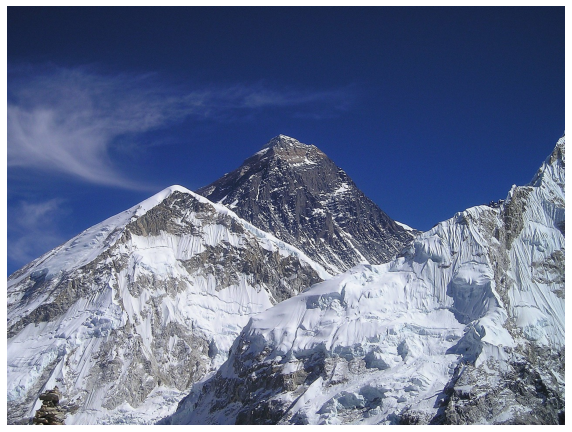

In [7]:
im = mpimg.imread("../images/hill.png") # read the image from disk as a numpy ndarray
print(im.shape, im.dtype, type(im)) # this image contains an α channel, hence num_channels= 4
# (960, 1280, 4) float32 <class 'numpy.ndarray'>
plt.figure(figsize=(10,10))
plt.imshow(im) # display the image
plt.axis('off')
plt.show()

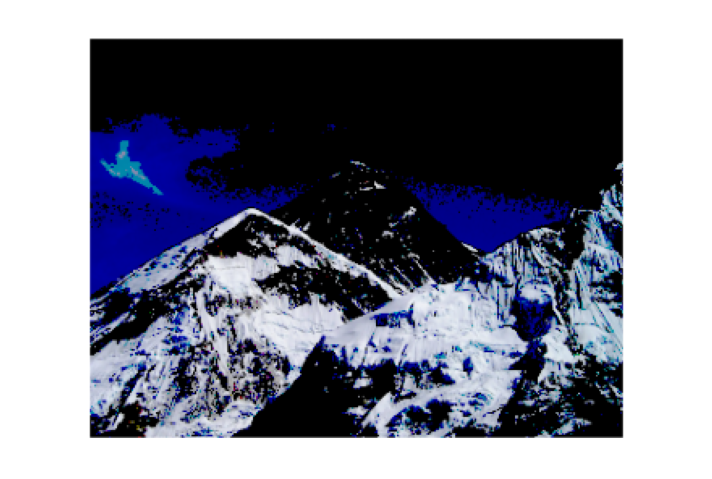

In [9]:
im1 = im
im1[im1 < 0.5] = 0 # make the image look darker
plt.imshow(im1)
plt.axis('off')
plt.tight_layout()
plt.savefig("../images/hill_dark.png") # save the dark image
plt.close()
im = mpimg.imread("../images/hill_dark.png") # read the dark image
plt.figure(figsize=(10,10))
plt.imshow(im)
plt.axis('off') # no axis ticks
plt.tight_layout()
plt.show()

### Interpolating while displaying with matplotlib imshow

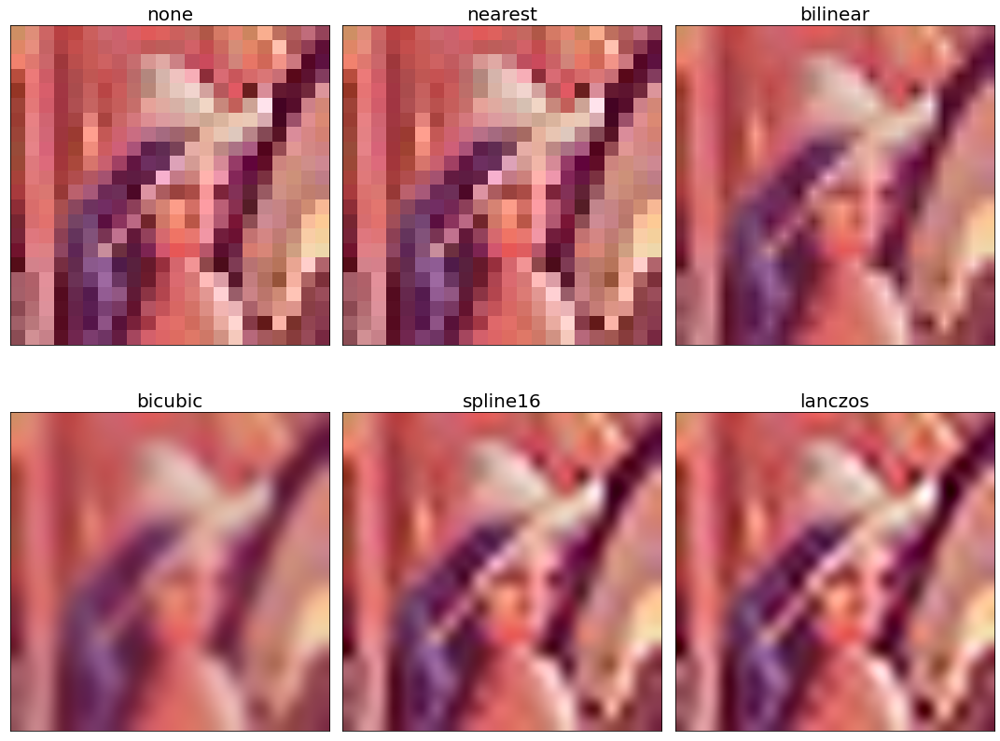

In [12]:
im = mpimg.imread("../images/lena_small.jpg") # read the image from disk as a numpy ndarray
methods = ['none', 'nearest', 'bilinear', 'bicubic', 'spline16', 'lanczos']
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 12), subplot_kw={'xticks': [], 'yticks': []})
fig.subplots_adjust(hspace=0.05, wspace=0.05)
for ax, interp_method in zip(axes.flat, methods):
    ax.imshow(im, interpolation=interp_method)
    ax.set_title(str(interp_method), size=20)
plt.tight_layout()
plt.show()

### Reading, saving, and displaying an image using scikit-image

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(340, 453, 3) uint8 <class 'numpy.ndarray'>


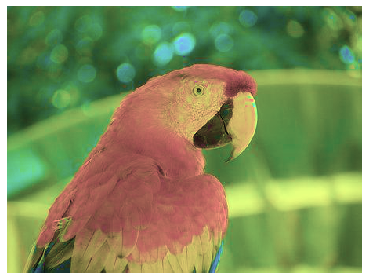

((0.0, 1.0, 0.0, 1.0), <matplotlib.image.AxesImage at 0x7f6eec884be0>, None)

In [2]:
im = imread("../images/parrot.png") # read image from disk, provide the correct path
print(im.shape, im.dtype, type(im))
hsv = color.rgb2hsv(im) # from RGB to HSV color space
hsv[:, :, 1] = 0.5 # change the saturation
im1 = color.hsv2rgb(hsv) # from HSV back to RGB
imsave('../images/parrot_hsv.png', im1) # save image to disk
im = imread("../images/parrot_hsv.png")
plt.axis('off'), imshow(im), show()

In [5]:
viewer = viewer.ImageViewer(im)
viewer.show()

<ipython-input-5-3c0bded5378c>:1: FutureWarning: `viewer` is deprecated and will be removed in 0.20. For alternatives, refer to https://scikit-image.org/docs/stable/user_guide/visualization.html
  viewer = viewer.ImageViewer(im)


AttributeError: 'QtGui_cls' object has no attribute 'QApplication'

### Using scikit-image's astronaut dataset

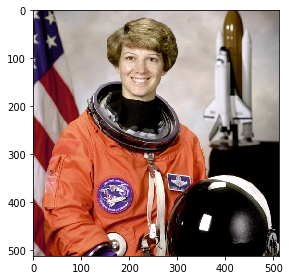

(<matplotlib.image.AxesImage at 0x7f6eec714b80>, None)

In [6]:
im = data.astronaut()
imshow(im), show()

### Using scipy.misc's face dataset

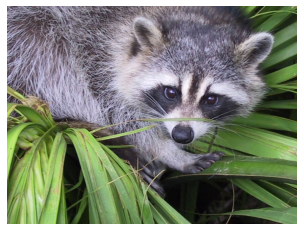

(<matplotlib.image.AxesImage at 0x7f6eec6d90a0>,
 (-0.5, 1023.5, 767.5, -0.5),
 None)

In [8]:
im = misc.face() # load the raccoon's face image
plt.imsave('face.png', im) # uses the Image module (PIL)
plt.imshow(im), plt.axis('off'), plt.show()

In [10]:
im = plt.imread('../images/pepper.jpg')
print(type(im), im.shape, im.dtype)
# <class 'numpy.ndarray'> (225, 225, 3) uint8

<class 'numpy.ndarray'> (225, 225, 3) uint8


<class 'imageio.core.util.Array'> (225, 225, 3) uint8


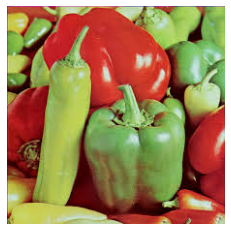

(<matplotlib.image.AxesImage at 0x7f6eec6487c0>,
 (-0.5, 224.5, 224.5, -0.5),
 None)

In [11]:
import imageio
im = imageio.imread('../images/pepper.jpg')
print(type(im), im.shape, im.dtype)
plt.imshow(im), plt.axis('off'), plt.show()

### Converting from one file format to another

In [12]:
im = Image.open("../images/parrot.png")
print(im.mode)
im.save("../images/parrot.jpg")

RGB


In [13]:
im = Image.open("../images/hill.png")
print(im.mode)
# RGBA
im.convert('RGB').save("../images/hill.jpg") # first convert to RGB mode

RGBA


### Converting from one image mode into another

(340, 453)


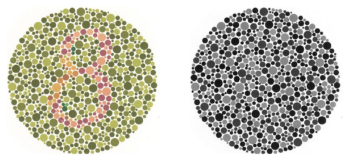

In [16]:
im = imread("../images/parrot.png", as_gray=True)
print(im.shape)
im = imread("../images/Ishihara.png")
im_g = color.rgb2gray(im)
plt.subplot(121), plt.imshow(im, cmap='gray'), plt.axis('off')
plt.subplot(122), plt.imshow(im_g, cmap='gray'), plt.axis('off')
plt.show()

### Converting from one color space into another

<Figure size 432x288 with 0 Axes>

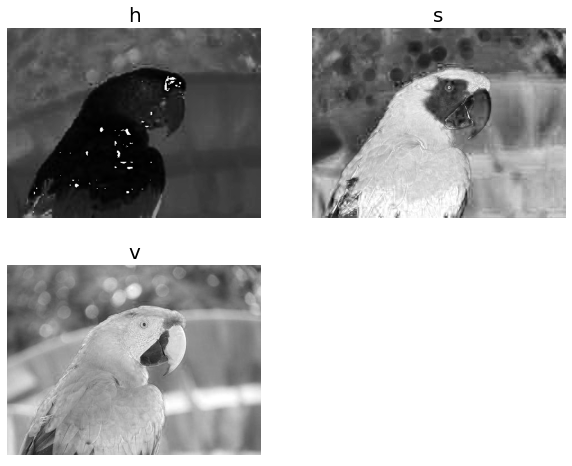

In [17]:
im = imread("../images/parrot.png")
im_hsv = color.rgb2hsv(im)
plt.gray()
plt.figure(figsize=(10,8))
plt.subplot(221), plt.imshow(im_hsv[...,0]), plt.title('h', size=20),
plt.axis('off')
plt.subplot(222), plt.imshow(im_hsv[...,1]), plt.title('s', size=20),
plt.axis('off')
plt.subplot(223), plt.imshow(im_hsv[...,2]), plt.title('v', size=20),
plt.axis('off')
plt.subplot(224), plt.axis('off')
plt.show()

### Converting image data structures

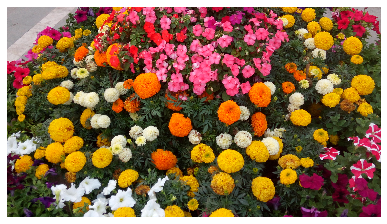

((-0.5, 4095.5, 2303.5, -0.5), None)

In [18]:
im = Image.open('../images/flowers.png') # read image into an Image object with PIL
im = np.array(im) # create a numpy ndarray from the Image object
imshow(im) # use skimage imshow to display the image
plt.axis('off'), show()

In [19]:
im = imread('../images/flowers.png') # read image into numpy ndarray with skimage
im = Image.fromarray(im) # create a PIL Image object from the numpy ndarray
im.show() # display the image with PIL Image.show() method

### Image manipulations with numpy array slicing

[180  76  83]


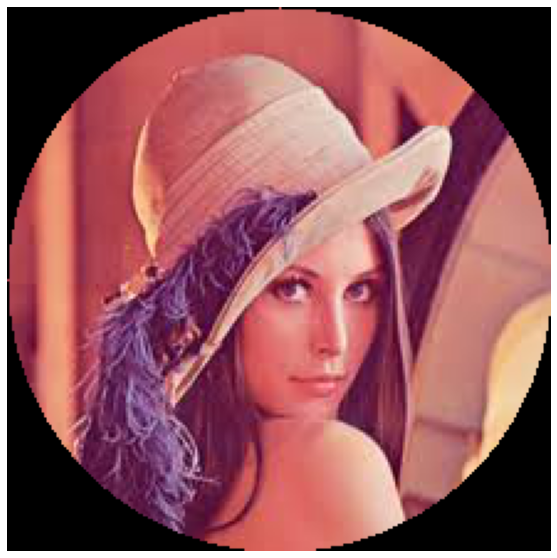

(<matplotlib.image.AxesImage at 0x7f6f09afefd0>,
 (-0.5, 219.5, 219.5, -0.5),
 None)

In [35]:
lena = mpimg.imread("../images/lena.jpg") # read the image from disk as a numpy ndarray
lena = np.array(lena)
print(lena[0, 40])
# print(lena[10:13, 20:23,0:1]) # slicing
lx, ly, _ = lena.shape
X, Y = np.ogrid[0:lx, 0:ly]
mask = (X - lx / 2) ** 2 + (Y - ly / 2) ** 2 > lx * ly / 4
lena[mask,:] = 0 # masks
plt.figure(figsize=(10,10))
plt.imshow(lena), plt.axis('off'), plt.show()

### Simple image morphing - α-blending of two images using cross-dissolving

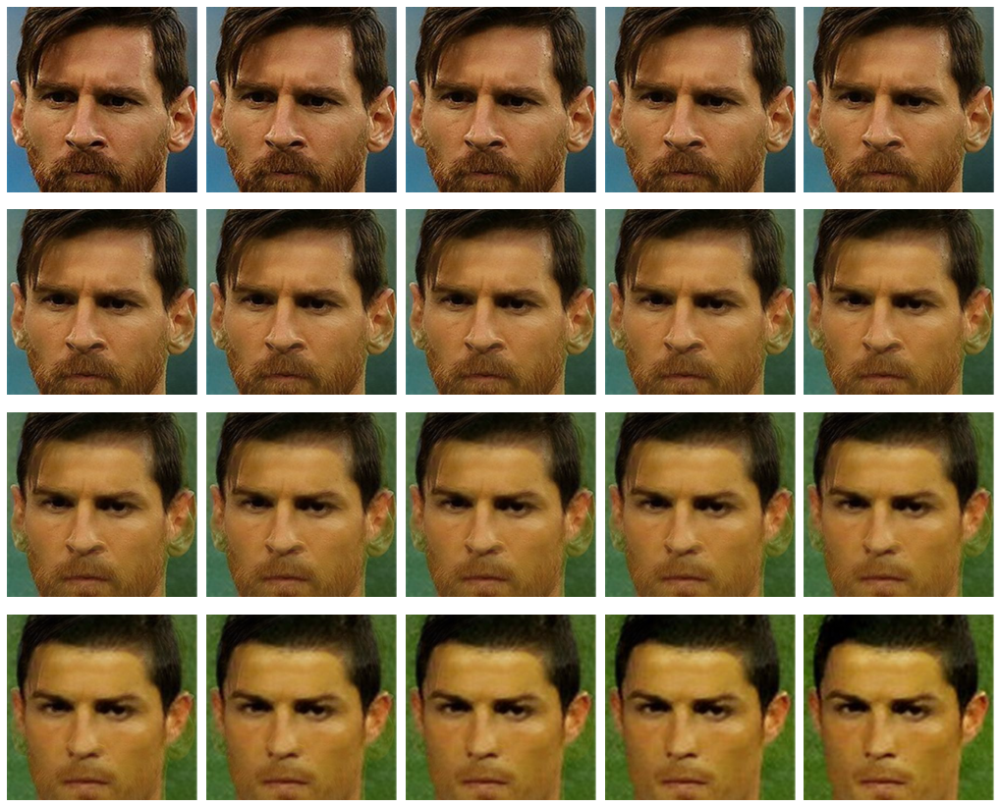

In [39]:
im1 = mpimg.imread("../images/messi.jpg") / 255 # scale RGB values in [0,1]
im2 = mpimg.imread("../images/ronaldo.jpg") / 255
i = 1
plt.figure(figsize=(18,15))
for alpha in np.linspace(0,1,20):
    plt.subplot(4,5,i)
    plt.imshow((1-alpha)*im1 + alpha*im2)
    plt.axis('off')
    i += 1
plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.show()

### Image manipulations with PIL

In [40]:
im = Image.open("../images/parrot.png") # open the image, provide the correct path
print(im.width, im.height, im.mode, im.format) # print image size, mode and format

453 340 RGB PNG


### Cropping an image

In [41]:
im_c = im.crop((175,75,320,200)) # crop the rectangle given by (left, top, right, bottom) from the image
im_c.show()

### Resizing an image

In [45]:
im = Image.open("../images/clock.jpg")
print(im.width, im.height)
im.show()

107 105


In [47]:
im_large = im.resize((im.width*5, im.height*5), Image.BILINEAR) # bi-linear interpolation
im_large.show()

In [48]:
im = Image.open("../images/victoria_memorial.png")
print(im.width, im.height)
im.show()

720 540


In [49]:
im_small = im.resize((im.width//5, im.height//5), Image.ANTIALIAS)
im_small.show()

### Negating an image

In [3]:
im = Image.open("../images/parrot.png")
#help(im.point)
im_t = im.point(lambda x: 255 - x)
im_t.show()

### Converting an image into grayscale

In [4]:
im_g = im.convert('L') # convert the RGB color image to a grayscale image
im_g.show()

### Log transformation

In [5]:
im_g.point(lambda x: 255*np.log(1+x/255)).show()

### Power-law transformation

In [6]:
im_g.point(lambda x: 255*(x/255)**0.6).show()

### Reflecting an image

In [9]:
im.transpose(Image.FLIP_LEFT_RIGHT).show() # reflect about the vertical axis

### Rotating an image

In [10]:
im_45 = im.rotate(45) # rotate the image by 45 degrees
im_45.show() # show the rotated image

### Applying an Affine transformation on an image

In [11]:
im = Image.open("../images/parrot.png")
im.transform((int(1.4*im.width), im.height), Image.AFFINE,
data=(1,-0.5,0,0,1,0)).show() # shear

### Perspective transformation

In [13]:
params = [1, 0.1, 0, -0.1, 0.5, 0, -0.005, -0.001]
im1 = im.transform((im.width//3, im.height), Image.PERSPECTIVE, params,
Image.BICUBIC)
im1.show()
#help(im.transform)

### Changing pixel values of an image

In [14]:
# choose 5000 random locations inside image
im1 = im.copy() # keep the original image, create a copy
n = 5000
x, y = np.random.randint(0, im.width, n), np.random.randint(0, im.height,n)
for (x,y) in zip(x,y):
    im1.putpixel((x, y), ((0,0,0) if np.random.rand() < 0.5 else (255,255,255))) # salt-and-pepper noise
im1.show()

### Drawing on an image

In [15]:
im = Image.open("../images/parrot.png")
draw = ImageDraw.Draw(im)
draw.ellipse((125, 125, 200, 250), fill=(255,255,255,128))
del draw
im.show()

### Drawing text on an image

In [2]:
im = Image.open("../images/parrot.png")
draw = ImageDraw.Draw(im)
font = ImageFont.truetype("NotoSerifTamil-Regular.ttf", 23, layout_engine=ImageFont.LAYOUT_RAQM) # use a truetype font
draw.text((10, 5), "கிளியைப்பார்!", font=font)
del draw
im.show()

### Creating a thumbnail

In [4]:
im = Image.open("../images/parrot.png")
im_thumbnail = im.copy() # need to copy the original image first
im_thumbnail.thumbnail((100,100)) # now paste the thumbnail on the image
im.paste(im_thumbnail, (10,10))
im.save("../images/parrot_thumb.jpg")
im.show()

### Computing the basic statistics of an image

In [9]:
s = stat.Stat(im)
print(s.extrema) # maximum and minimum pixel values for each channel R, G, B
print(s.count)
print(s.mean)
print(s.median)
print(s.stddev)

[(0, 255), (0, 255), (0, 253)]
[154020, 154020, 154020]
[127.62875600571354, 124.87831450460979, 67.90167510712894]
[121, 130, 62]
[47.684082549676965, 52.24710084416372, 39.90999669801631]


### Plotting the histograms of pixel values for the RGB channels of an image

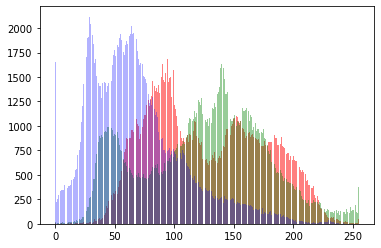

In [12]:
pl = im.histogram()
plt.bar(range(256), pl[:256], color='r', alpha=0.5)
plt.bar(range(256), pl[256:2*256], color='g', alpha=0.4)
plt.bar(range(256), pl[2*256:], color='b', alpha=0.3)
plt.show()

### Separating the RGB channels of an image

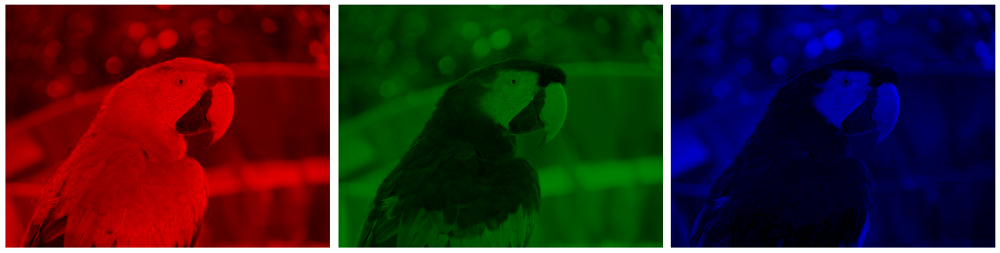

In [12]:
im = Image.open("../images/parrot.png")
ch_r, ch_g, ch_b = im.split() # split the RGB image into 3 channels: R, G and B
# we shall use matplotlib to display the channels
#help(plt.cm)
cm_red = LinearSegmentedColormap.from_list("mycmap", ["black", "red"])
cm_green = LinearSegmentedColormap.from_list("mycmap", ["black", "green"])
cm_blue = LinearSegmentedColormap.from_list("mycmap", ["black", "blue"])
plt.figure(figsize=(18,6))
plt.subplot(1,3,1); plt.imshow(ch_r, cmap=cm_red); plt.axis('off')
plt.subplot(1,3,2); plt.imshow(ch_g, cmap=cm_green); plt.axis('off')
plt.subplot(1,3,3); plt.imshow(ch_b, cmap=cm_blue); plt.axis('off')
plt.tight_layout()
plt.show() # show the R, G, B channels

### Combining multiple channels of an image

In [13]:
im = Image.merge('RGB', (ch_b, ch_g, ch_r)) # swap the red and blue channels obtained last time with split()
im.show()

### α-blending two images

In [11]:
im1 = Image.open("../images/parrot.png")
im2 = Image.open("../images/hill.png")
im1 = im1.convert('RGBA') # two images have different modes, must be converted to the same mode
im2 = im2.resize((im1.width, im1.height), Image.BILINEAR) # two images have different sizes, must be converted to the same size
im = Image.blend(im1, im2, alpha=0.5).show()

### Superimposing two images

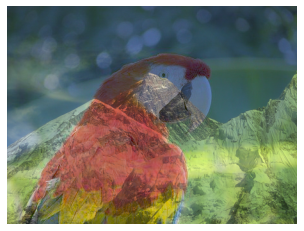

In [32]:
im1 = Image.open("../images/parrot.png")
im2 = Image.open("../images/hill.png").convert('RGB').resize((im1.width, im1.height))
#multiply(im1, im2)
plt.imshow(np.sqrt((np.array(im1)/255) * (np.array(im2)/255)))
plt.axis('off')
plt.show()

### Adding two images

In [33]:
add(im1, im2).show()

### Computing the difference between two images

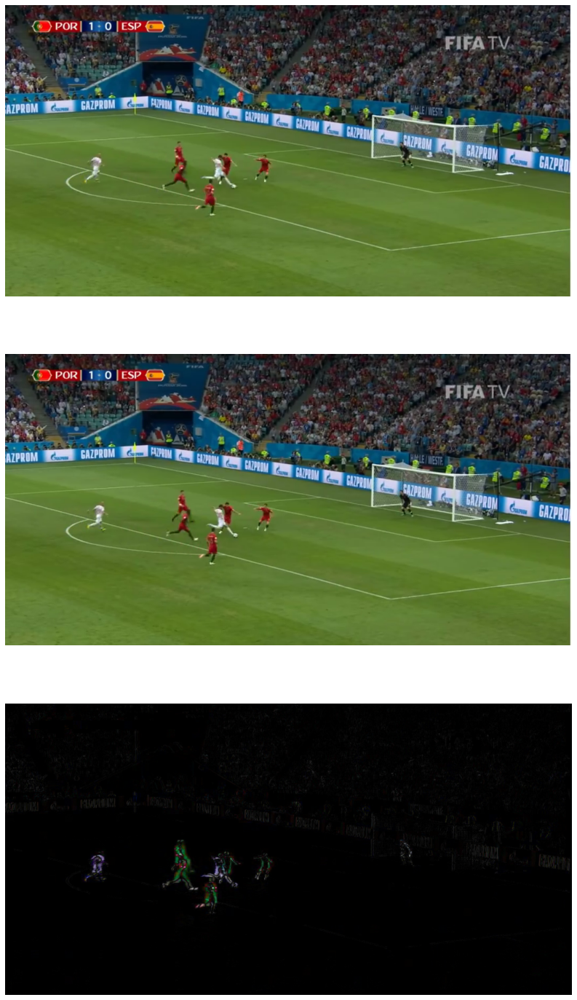

In [34]:
from PIL.ImageChops import subtract, multiply, screen, difference, add
im1 = Image.open("../images/goal1.png") # load two consecutive frame images from the video
im2 = Image.open("../images/goal2.png")
im = difference(im1, im2)
plt.figure(figsize=(20,25))
im.save("../images/goal_diff.png")
plt.subplot(311)
plt.imshow(im1)
plt.axis('off')
plt.subplot(312)
plt.imshow(im2)
plt.axis('off')
plt.subplot(313)
plt.imshow(im), plt.axis('off')
plt.show()

### Inverse warping and geometric transformation using the warp() function

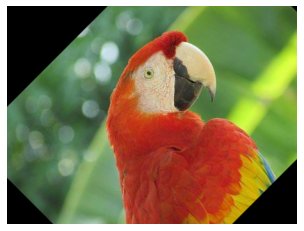

(<matplotlib.image.AxesImage at 0x7fa684e50d60>,
 (-0.5, 452.5, 339.5, -0.5),
 None)

In [35]:
im = imread("../images/parrot.png")
tform = SimilarityTransform(scale=0.9,
rotation=np.pi/4,translation=(im.shape[0]/2, -100))
warped = warp(im, tform)
import matplotlib.pyplot as plt
plt.imshow(warped), plt.axis('off'), plt.show()

### Applying the swirl transform

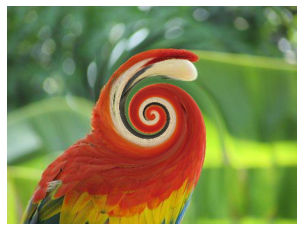

In [36]:
im = imread("../images/parrot.png")
swirled = swirl(im, rotation=0, strength=15, radius=200)
plt.imshow(swirled)
plt.axis('off')
plt.show()

### Adding random Gaussian noise to images

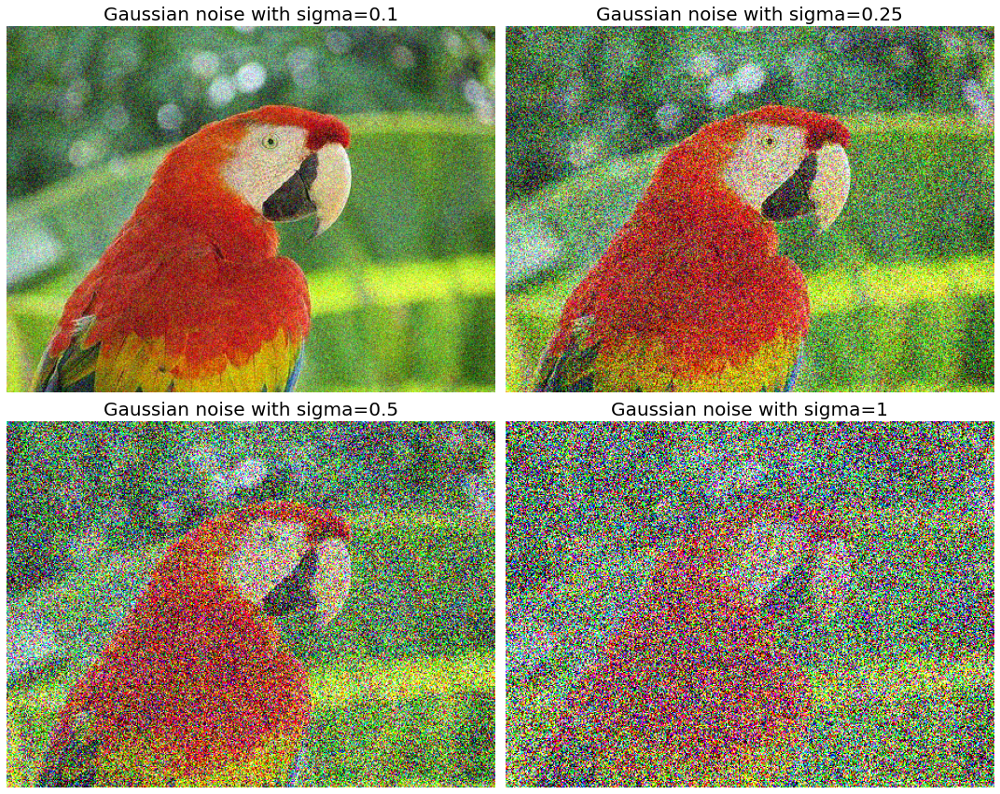

In [38]:
im = img_as_float(imread("../images/parrot.png"))
plt.figure(figsize=(15,12))
sigmas = [0.1, 0.25, 0.5, 1]
for i in range(4):
    noisy = random_noise(im, var=sigmas[i]**2)
    plt.subplot(2,2,i+1)
    plt.imshow(noisy)
    plt.axis('off')
    plt.title('Gaussian noise with sigma=' + str(sigmas[i]), size=20)
plt.tight_layout()
plt.show()

### Drawing contour lines for an image

<ipython-input-39-c95cc0f9edba>:2: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  im = rgb2gray(imread("../images/einstein.jpg")) # read the image from disk as a numpy ndarray


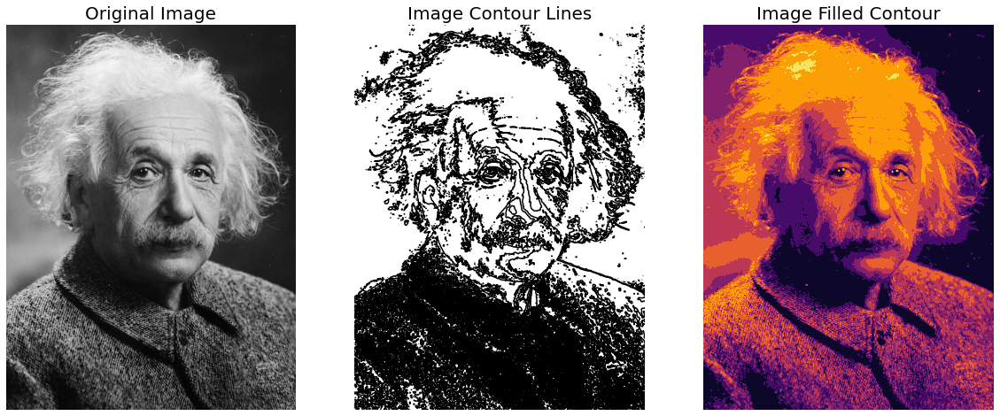

In [39]:
from skimage.color import rgb2gray
im = rgb2gray(imread("../images/einstein.jpg")) # read the image from disk as a numpy ndarray
plt.figure(figsize=(20,8))
plt.subplot(131), plt.imshow(im, cmap='gray'), plt.axis('off'), plt.title('Original Image', size=20)
plt.subplot(132), plt.contour(np.flipud(im), colors='k',
levels=np.logspace(-15, 15, 100)), plt.axis('off')
plt.title('Image Contour Lines', size=20)
plt.subplot(133), plt.title('Image Filled Contour', size=20),
plt.contourf(np.flipud(im), cmap='inferno'), plt.axis('off')
plt.show()